# Download dataset

In [ ]:
!pip install kaggle
!pip install ydata_profiling
!pip install imbalanced-learn
!pip install mixed-naive-bayes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.3/399.3 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 49.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.8 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.2
    Uninstalling scipy-1.16.2:
      Successfully uninstalled scipy-1.16.2


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"saatvikmtech","key":"e675c36acec415887dcabdbf052957ab"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c ait-511-course-project-1-obesity-risk
!unzip ait-511-course-project-1-obesity-risk.zip

  0% 0.00/570k [00:00<?, ?B/s]
100% 570k/570k [00:00<00:00, 637MB/s]
Archive:  ait-511-course-project-1-obesity-risk.zip
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


In [ ]:
!kaggle datasets download -d aravindpcoder/obesity-or-cvd-risk-classifyregressorcluster
!unzip obesity-or-cvd-risk-classifyregressorcluster.zip

Dataset URL: https://www.kaggle.com/datasets/aravindpcoder/obesity-or-cvd-risk-classifyregressorcluster
License(s): CC-BY-SA-4.0
  0% 0.00/57.5k [00:00<?, ?B/s]
100% 57.5k/57.5k [00:00<00:00, 30.8MB/s]
Archive:  obesity-or-cvd-risk-classifyregressorcluster.zip
  inflating: ObesityDataSet.csv      


# EDA and Preprocessing

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, StandardScaler
from ydata_profiling import ProfileReport

In [ ]:
original = pd.read_csv("ObesityDataSet.csv")
original

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


In [ ]:
train = pd.read_csv("train.csv")
train

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,WeightCategory
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15528,15528,Male,18.000000,1.700000,50.000000,no,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,2.000000,Sometimes,Public_Transportation,Insufficient_Weight
15529,15529,Male,18.000000,1.763101,55.523481,yes,yes,2.786008,3.000000,Sometimes,no,1.962646,yes,0.028202,1.561272,Sometimes,Public_Transportation,Insufficient_Weight
15530,15530,Female,19.010211,1.686936,49.660995,no,yes,1.053534,3.452590,Sometimes,no,1.000000,no,2.001230,1.000000,Sometimes,Public_Transportation,Insufficient_Weight
15531,15531,Male,22.777890,1.805445,85.228116,yes,yes,2.000000,2.092179,Sometimes,no,2.452986,no,0.796770,0.000000,Sometimes,Public_Transportation,Overweight_Level_I


In [ ]:
original.rename(columns={'NObeyesdad': 'WeightCategory'}, inplace=True)
train.drop(columns=['id'], inplace=True)

In [ ]:
test = pd.read_csv("test.csv")
test

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,15533,Female,19.007177,1.772449,137.852618,yes,yes,3.000000,3.000000,Sometimes,no,2.007348,no,1.465931,0.813235,Sometimes,Public_Transportation
1,15534,Female,21.572114,1.698346,75.000000,yes,yes,2.000000,3.000000,Sometimes,no,2.000000,no,1.577824,1.865851,Sometimes,Public_Transportation
2,15535,Male,22.285024,1.737453,82.000000,yes,yes,2.000000,2.720642,Sometimes,no,1.830614,no,0.451009,0.000000,Sometimes,Public_Transportation
3,15536,Male,30.916426,1.775580,120.860386,yes,yes,2.712747,3.000000,Sometimes,no,2.144368,no,0.712726,0.100048,Sometimes,Automobile
4,15537,Female,18.000000,1.670000,65.000000,no,yes,2.000000,3.000000,Sometimes,no,2.000000,no,1.000000,1.000000,no,Public_Transportation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5220,20753,Male,25.137087,1.766626,114.187096,yes,yes,2.919584,3.000000,Sometimes,no,2.151809,no,1.330519,0.196680,Sometimes,Public_Transportation
5221,20754,Male,18.000000,1.710000,50.000000,no,yes,3.000000,4.000000,Frequently,no,1.000000,no,2.000000,1.000000,Sometimes,Public_Transportation
5222,20755,Male,20.101026,1.819557,105.580491,yes,yes,2.407817,3.000000,Sometimes,no,2.000000,no,1.158040,1.198439,no,Public_Transportation
5223,20756,Male,33.852953,1.700000,83.520113,yes,yes,2.671238,1.971472,Sometimes,no,2.144838,no,0.000000,0.973834,no,Automobile


## Univariate Analysis

In [ ]:
original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15533 entries, 0 to 15532
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          15533 non-null  object 
 1   Age                             15533 non-null  float64
 2   Height                          15533 non-null  float64
 3   Weight                          15533 non-null  float64
 4   family_history_with_overweight  15533 non-null  object 
 5   FAVC                            15533 non-null  object 
 6   FCVC                            15533 non-null  float64
 7   NCP                             15533 non-null  float64
 8   CAEC                            15533 non-null  object 
 9   SMOKE                           15533 non-null  object 
 10  CH2O                            15533 non-null  float64
 11  SCC                             15533 non-null  object 
 12  FAF                             

In [ ]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5225 entries, 0 to 5224
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              5225 non-null   int64  
 1   Gender                          5225 non-null   object 
 2   Age                             5225 non-null   float64
 3   Height                          5225 non-null   float64
 4   Weight                          5225 non-null   float64
 5   family_history_with_overweight  5225 non-null   object 
 6   FAVC                            5225 non-null   object 
 7   FCVC                            5225 non-null   float64
 8   NCP                             5225 non-null   float64
 9   CAEC                            5225 non-null   object 
 10  SMOKE                           5225 non-null   object 
 11  CH2O                            5225 non-null   float64
 12  SCC                             52

<u>**Abbreviated features meaning**</u>

FAVC: Frequent consumption of high caloric food\
FCVC: Frequency of consumption of vegetables\
NCP: Number of main meals\
CAEC: Consumption of food between meals\
SMOKE: Is a smoker\
CH20: Consumption of water daily\
CALC: Consumption of alcohol\
SCC: Calories consumption monitoring\
FAF: Physical activity frequency\
TUE: Time using technology devices\
MTRANS: Transportation used\
WeightCategory: Type of weight based on body mass index (BMI)

In [ ]:
for col in train.select_dtypes(include=['object']).columns:
    print(f"\nColumn: {col}")
    print(train[col].value_counts())


Column: Gender
Gender
Male      7783
Female    7750
Name: count, dtype: int64

Column: family_history_with_overweight
family_history_with_overweight
yes    12696
no      2837
Name: count, dtype: int64

Column: FAVC
FAVC
yes    14184
no      1349
Name: count, dtype: int64

Column: CAEC
CAEC
Sometimes     13126
Frequently     1858
Always          346
no              203
Name: count, dtype: int64

Column: SMOKE
SMOKE
no     15356
yes      177
Name: count, dtype: int64

Column: SCC
SCC
no     15019
yes      514
Name: count, dtype: int64

Column: CALC
CALC
Sometimes     11285
no             3841
Frequently      407
Name: count, dtype: int64

Column: MTRANS
MTRANS
Public_Transportation    12470
Automobile                2669
Walking                    340
Motorbike                   30
Bike                        24
Name: count, dtype: int64

Column: WeightCategory
WeightCategory
Obesity_Type_III       2983
Obesity_Type_II        2403
Normal_Weight          2345
Obesity_Type_I         2207


In [ ]:
def get_variable_types(dataframe):
    continuous_vars = []
    categorical_vars = []

    for column in dataframe.columns:
        if dataframe[column].dtype == 'object':
            categorical_vars.append(column)
        else:
            continuous_vars.append(column)

    return continuous_vars, categorical_vars

continuous_vars, categorical_vars = get_variable_types(train)

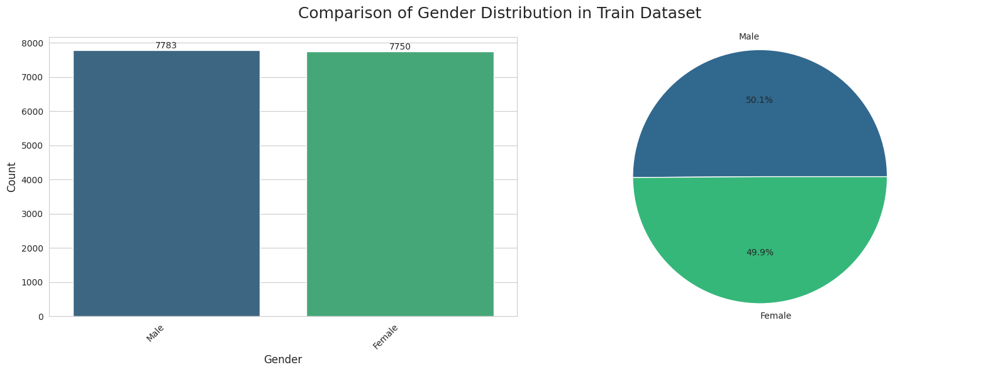

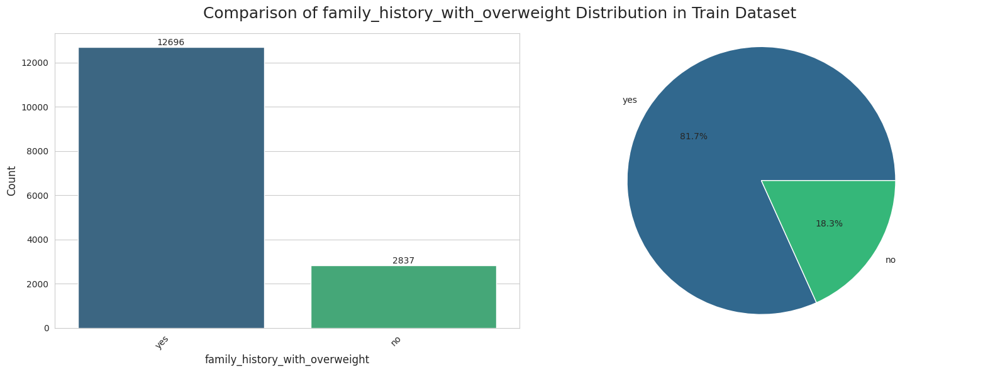

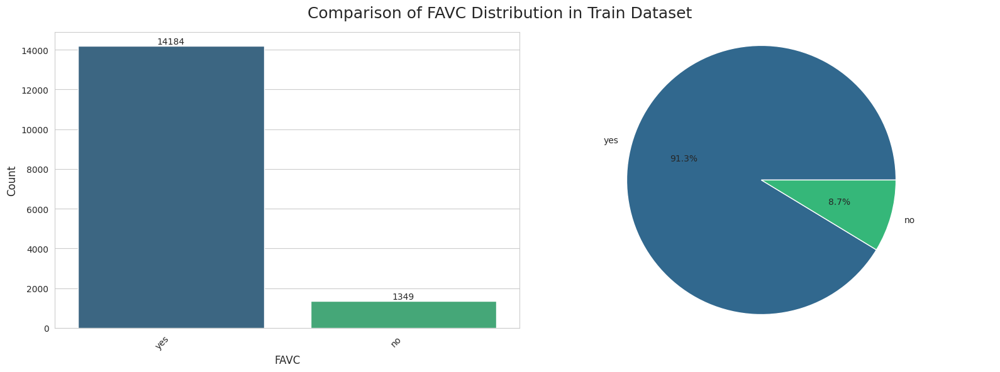

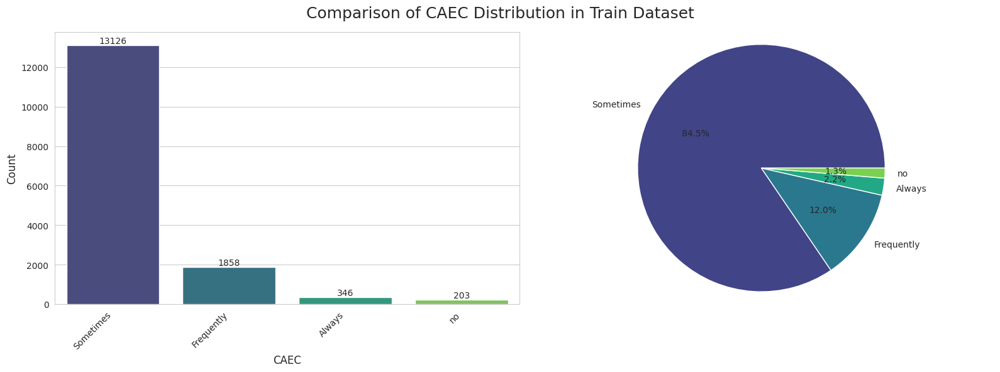

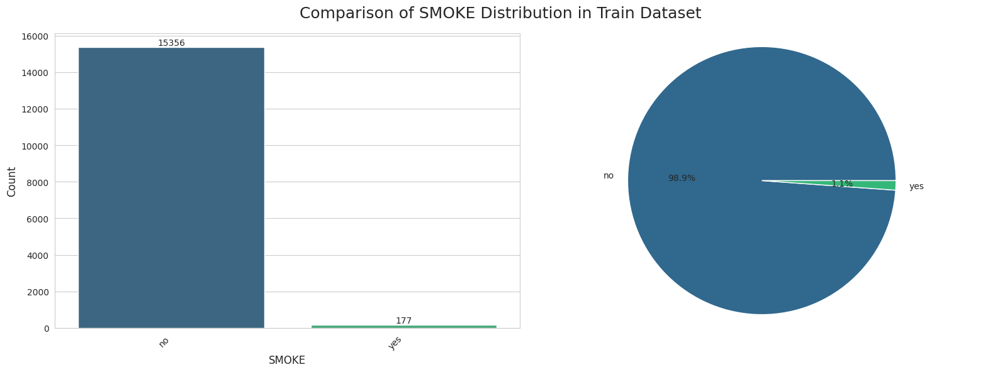

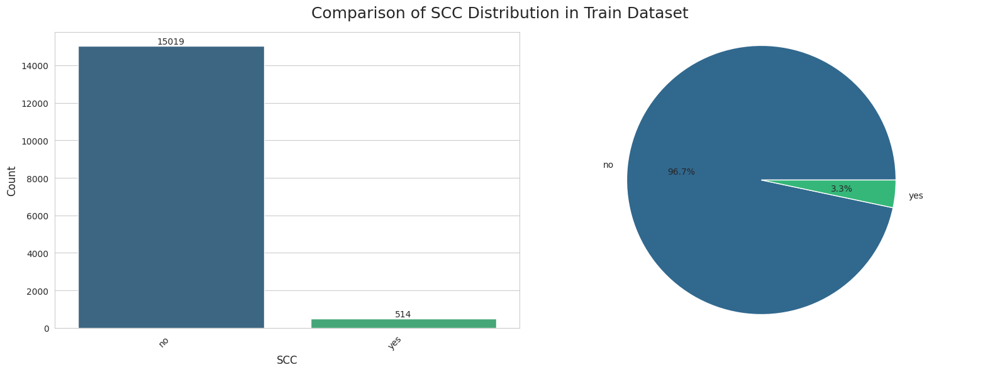

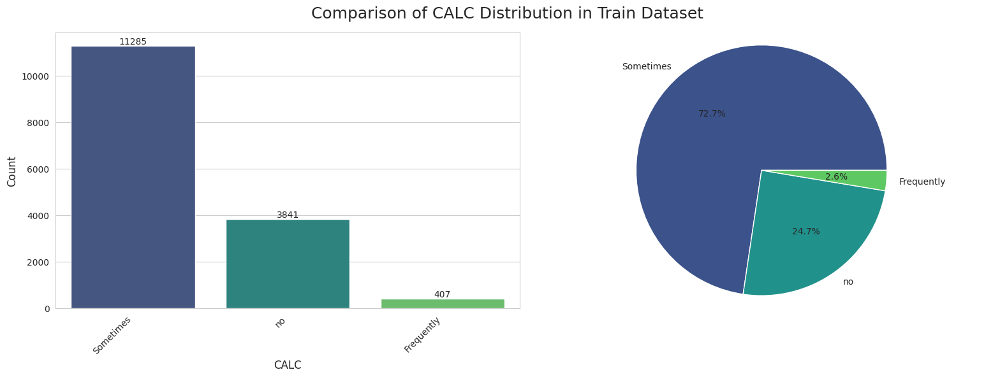

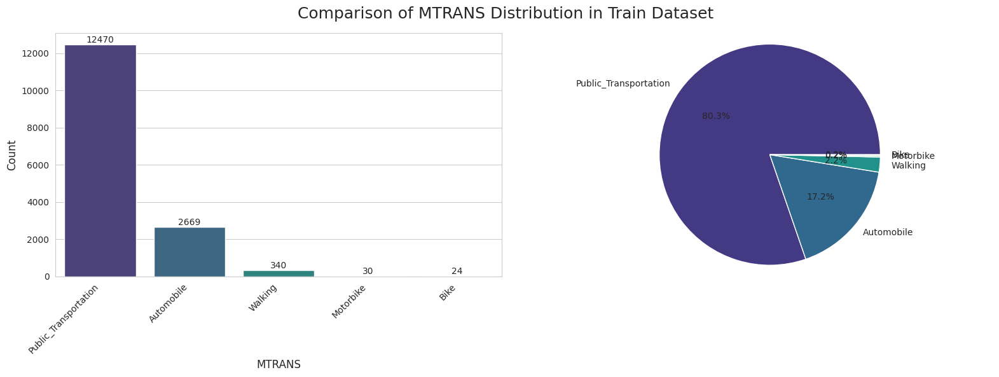

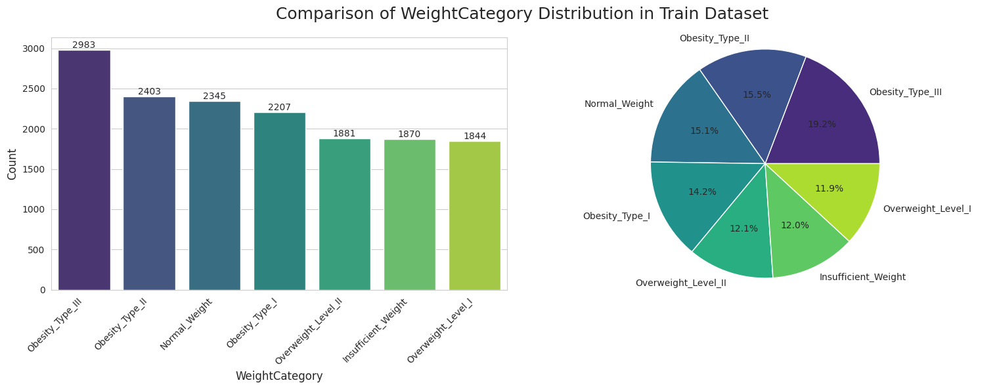

In [ ]:
# Plot the distribuition of a column
def plot_distribution(df, column):
    # Calculate value counts
    value_counts = df[column].value_counts()

    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # Bar plot on the first subplot
    sns.barplot(x=value_counts.index, y=value_counts.values, palette="viridis", ax=ax1)
    ax1.set_xlabel(column, fontsize=12)
    ax1.set_ylabel('Count', fontsize=12)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)

    # Add data labels above each bar
    for index, value in enumerate(value_counts):
        ax1.text(index, value, str(value), ha='center', va='bottom', fontsize=10)

    # Pie plot on the second subplot
    ax2.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', colors=sns.color_palette("viridis", len(value_counts)))
    ax2.axis('equal')

    # Main title for the figure
    fig.suptitle(f'Comparison of {column} Distribution in Train Dataset', fontsize=18)

    # Adjust layout and display the figure
    plt.tight_layout()
    plt.show()

# for each categorical column plots the distribution of each value
for column in categorical_vars:
    plot_distribution(train, column)

In [ ]:
output_order = ['Insufficient_Weight', 'Normal_Weight', 'Overweight_Level_I', 'Overweight_Level_II', 'Obesity_Type_I', 'Obesity_Type_II', 'Obesity_Type_III']
palette = sns.color_palette("tab10", n_colors=len(output_order))
custom_palette = dict(zip(output_order, palette))
df_train = train

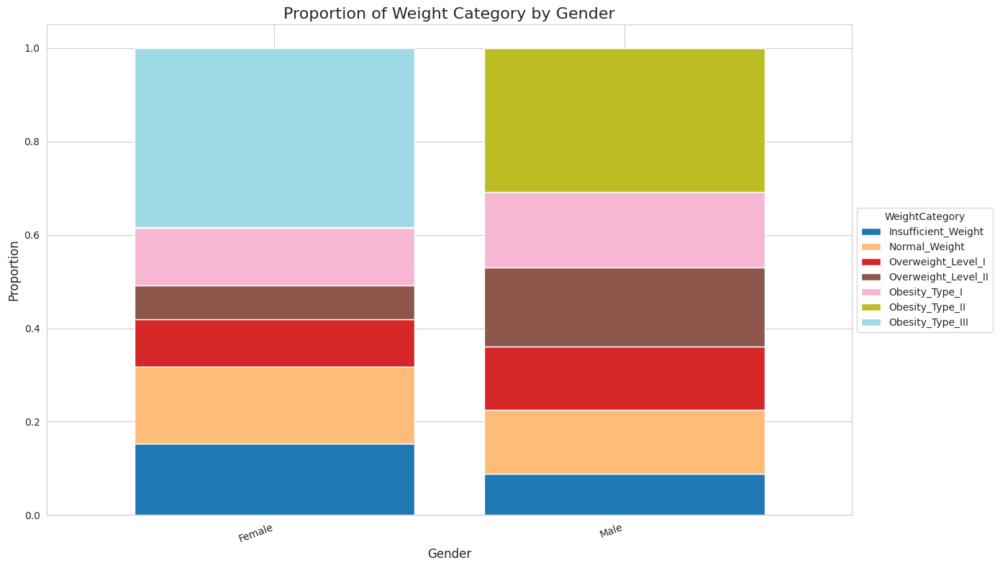

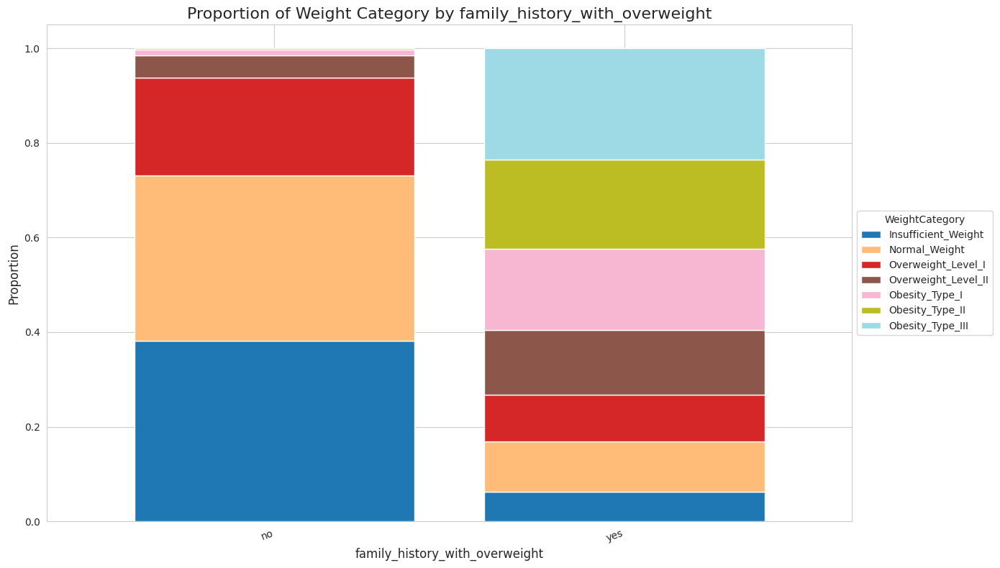

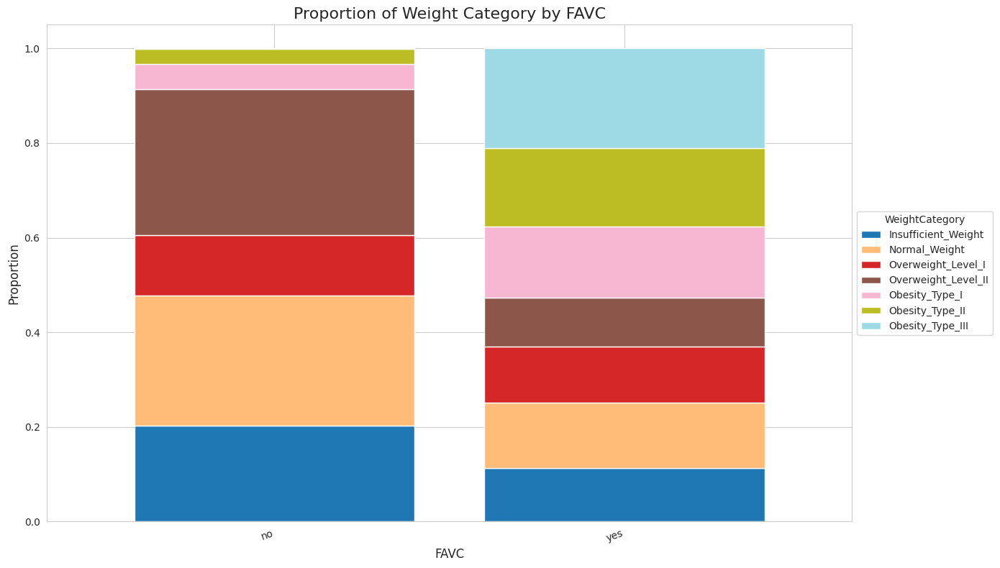

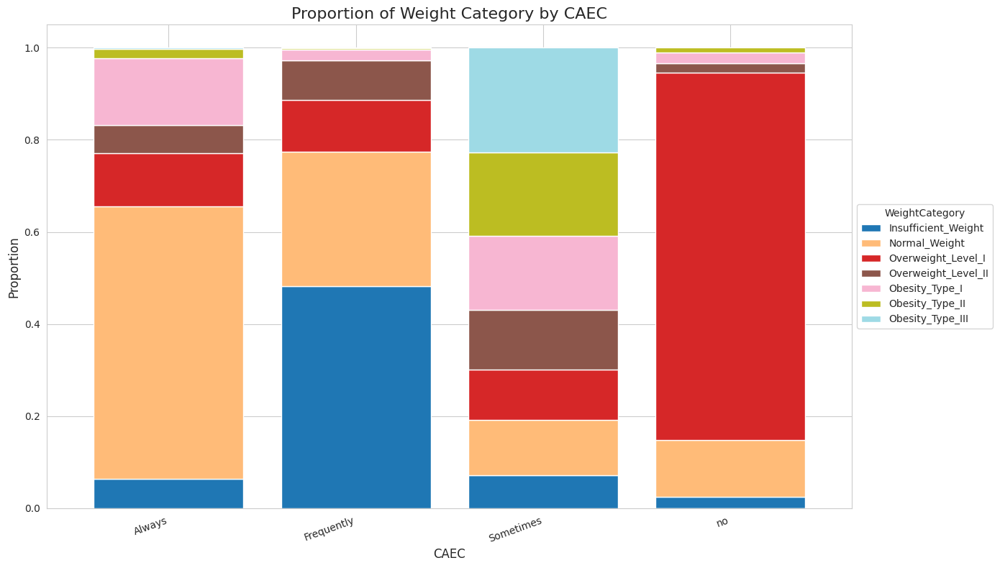

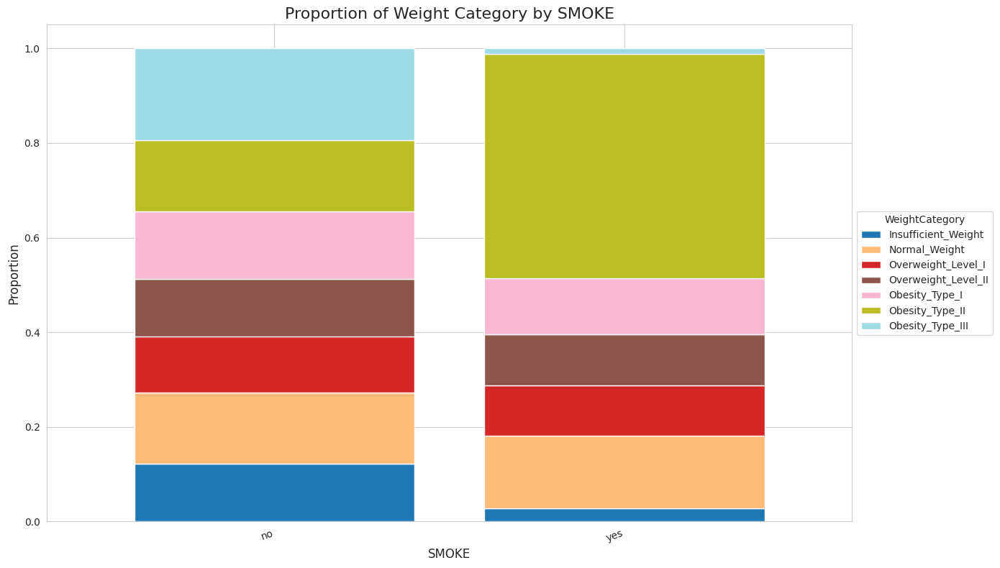

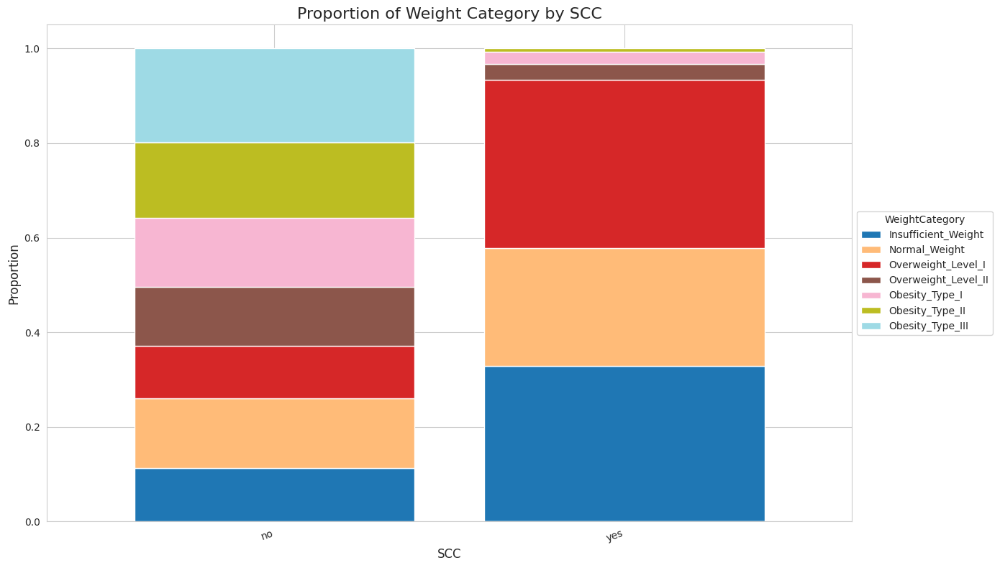

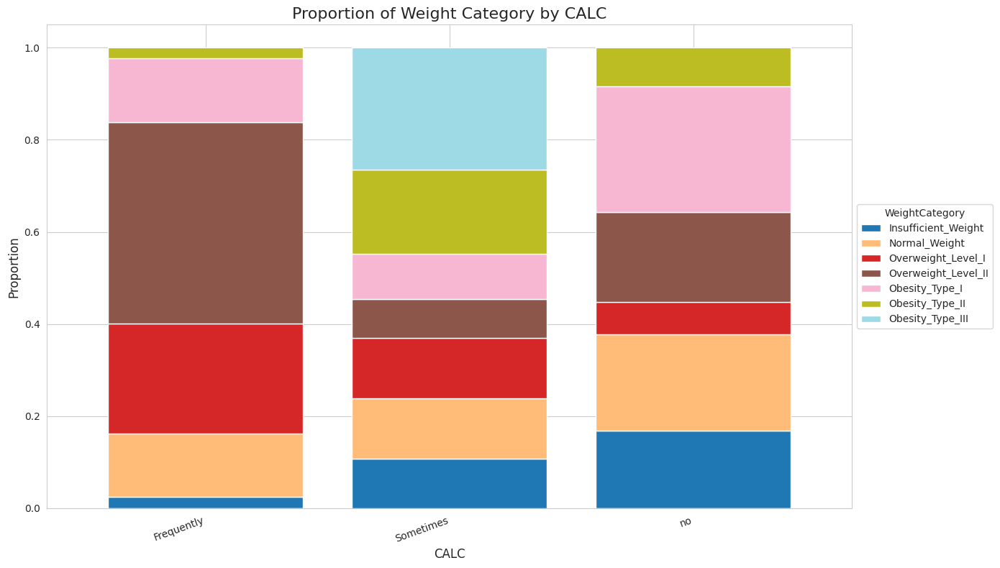

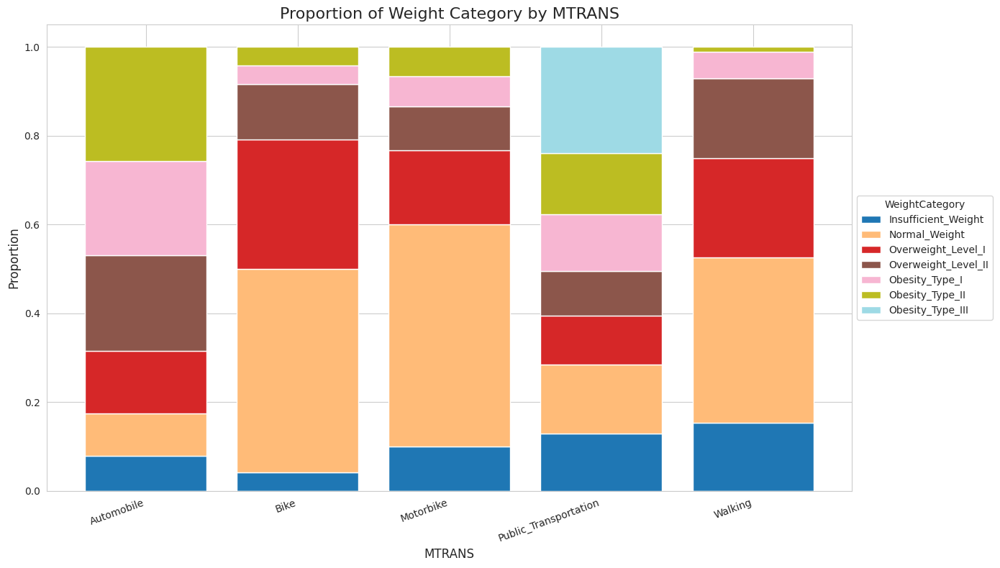

In [ ]:
for cat in categorical_vars:
    if cat == 'WeightCategory':
      continue

    plt.figure(figsize=(14, 8))

    # Compute normalized proportions for each feature class
    prop_df = df_train.groupby(cat)['WeightCategory'].value_counts(normalize=True).unstack()
    prop_df = prop_df.reindex(columns=output_order)

    # Plot proportional bar chart
    prop_df.plot(
        kind='bar',
        stacked=True,
        ax=plt.gca(),
        cmap='tab20', # Use a qualitative colormap
        width=0.8
    )

    # 5. Set titles and labels
    plt.title('Proportion of Weight Category by '+cat, fontsize=16)
    plt.xlabel(cat, fontsize=12)
    plt.ylabel('Proportion', fontsize=12)
    plt.xticks(rotation=20, ha='right') # Rotate x-axis labels for readability

    # 6. Place the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), title='WeightCategory')

    # Adjust layout to prevent legend from being cut off
    plt.tight_layout()
    plt.show()

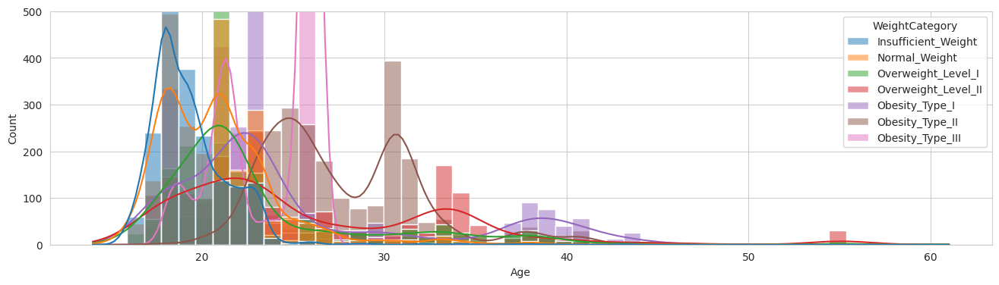

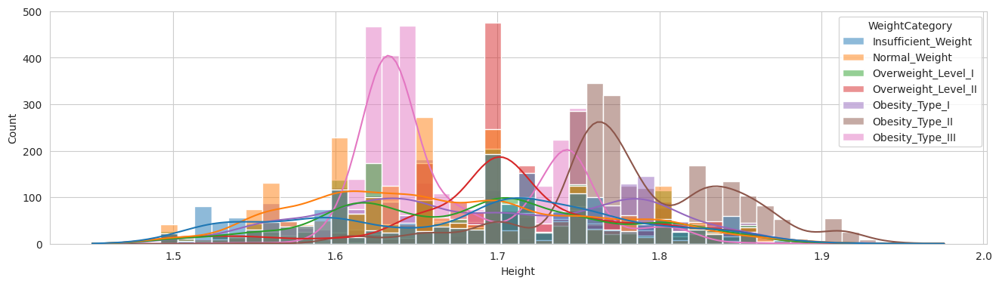

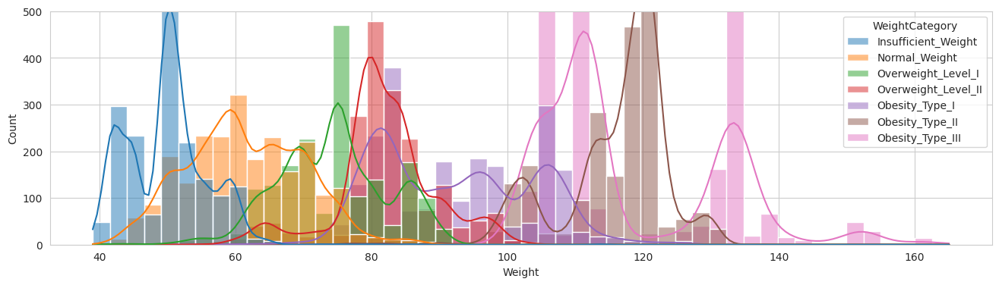

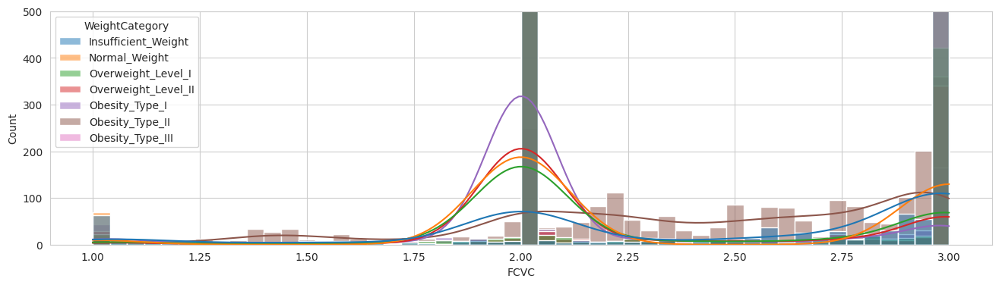

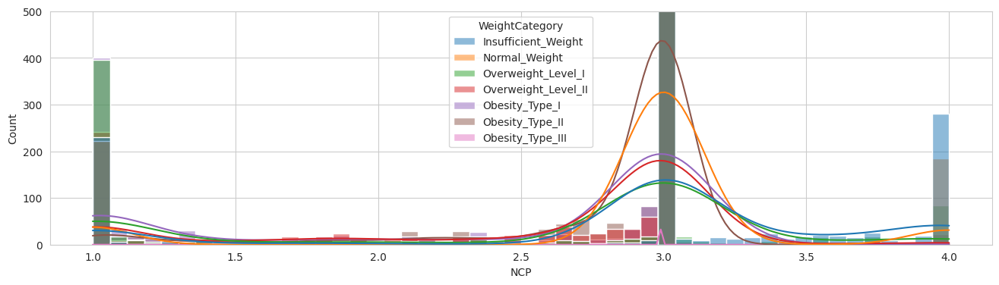

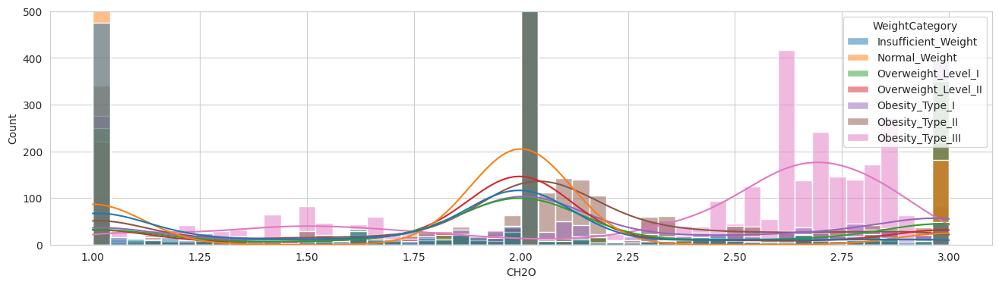

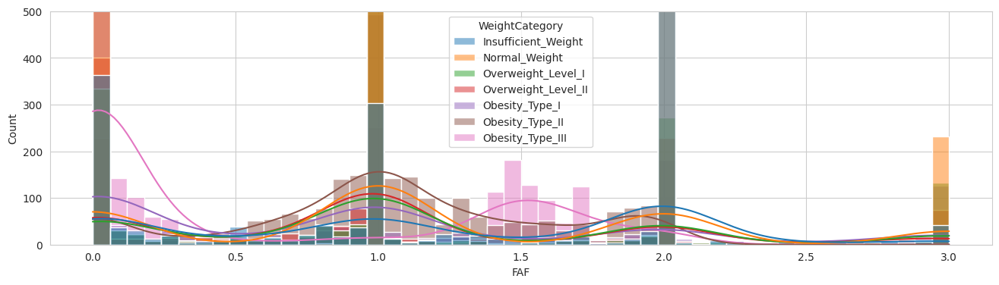

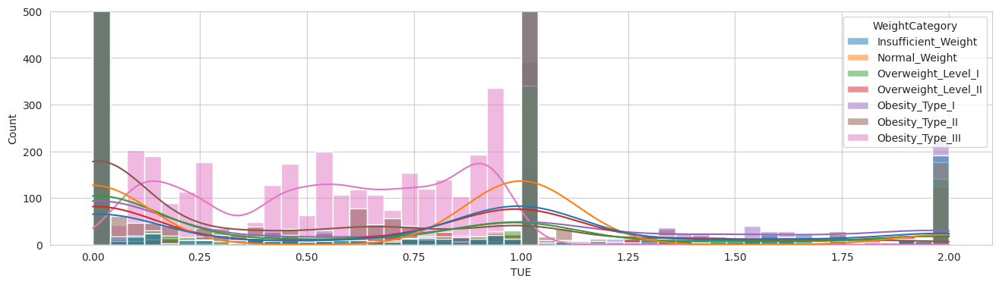

In [ ]:
# Plot a histogram of a column with the amount of column for each obesity result
def plot_histograms_and_density(dataframe, column):
    fig, ax = plt.subplots(figsize=(16, 4))
    fig = sns.histplot(data=dataframe, x=column, hue="WeightCategory", hue_order=output_order, palette=custom_palette, bins=50, kde=True)
    plt.ylim(0,500)
    plt.show()

# plot the histograms of the continuous columns
for column in continuous_vars:
    plot_histograms_and_density(df_train, column)

## Bivariate Analysis

In [ ]:
#Dividing Features
num_col = ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']
ord_col = ['CAEC', 'CALC']
tar_col = ['WeightCategory']
lab_col = []
for col in train.select_dtypes(include=['object']).columns:
  if col not in (ord_col + tar_col):
    lab_col.append(col)

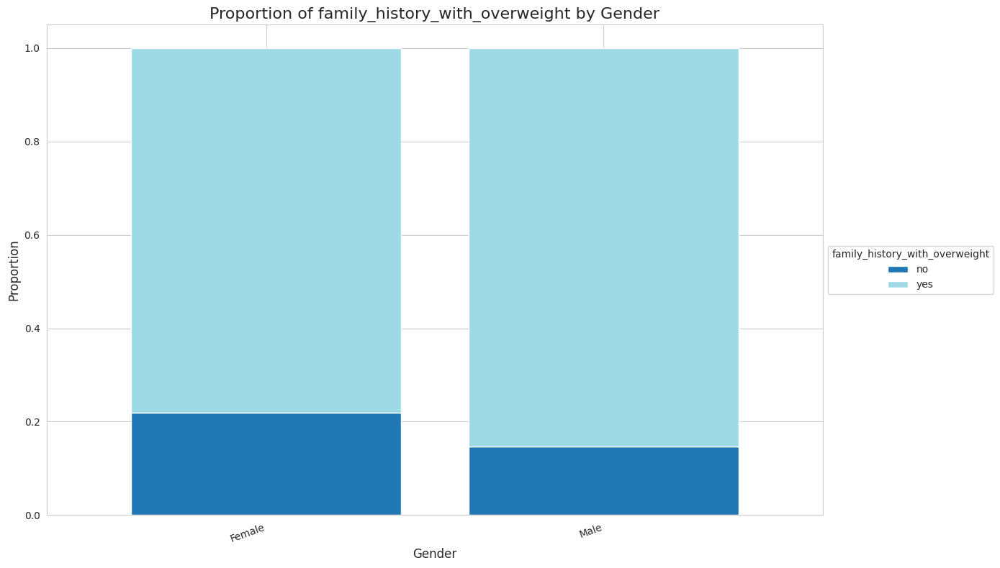

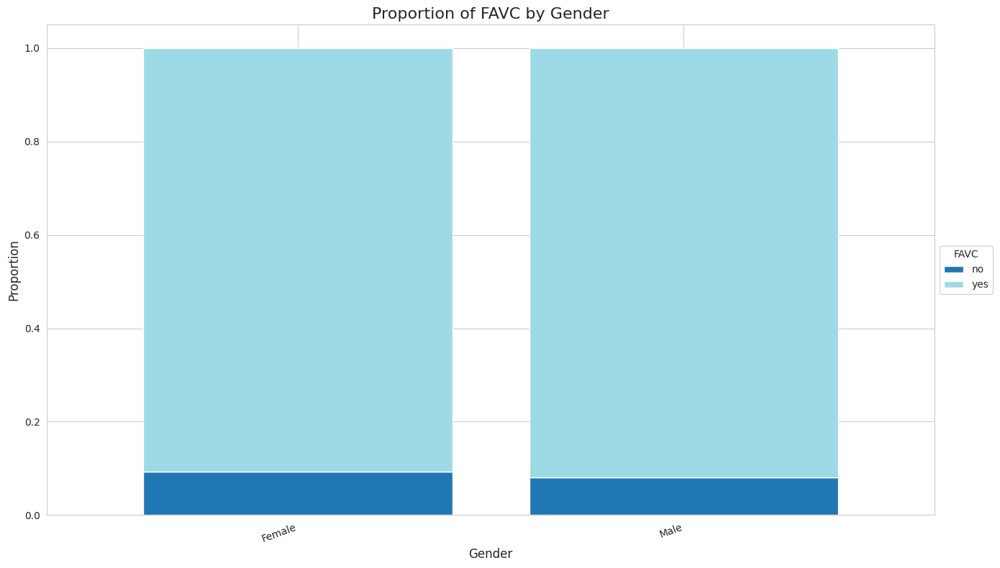

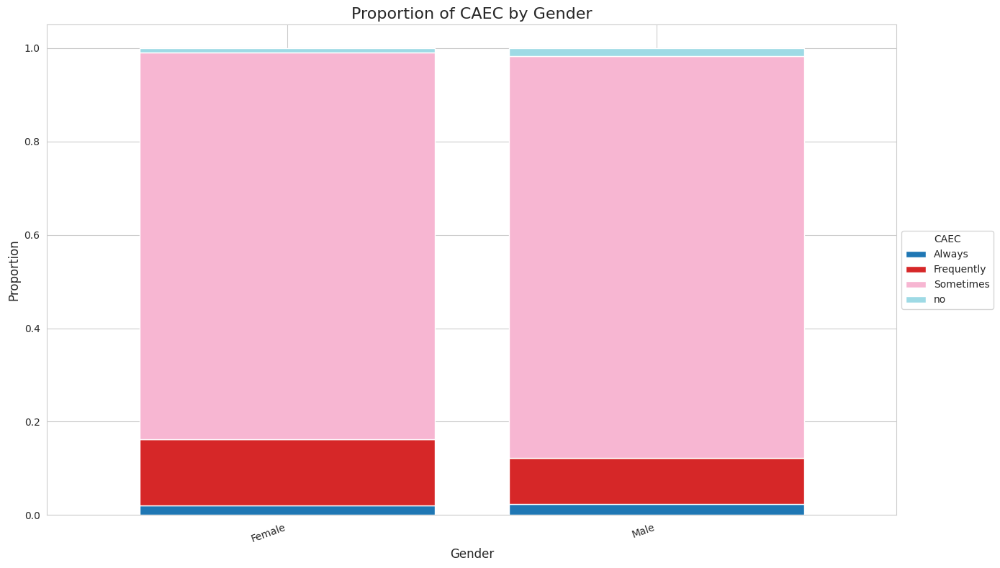

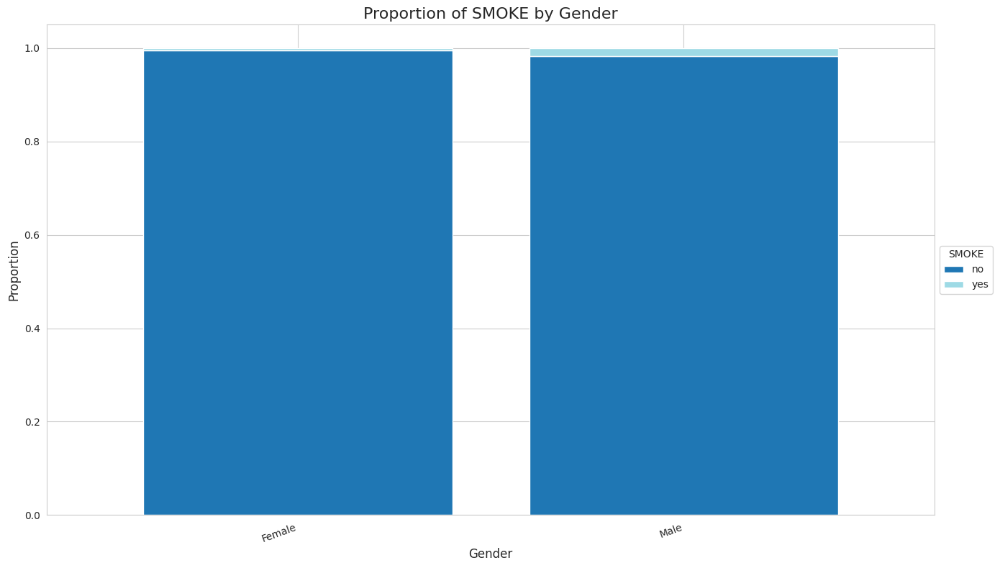

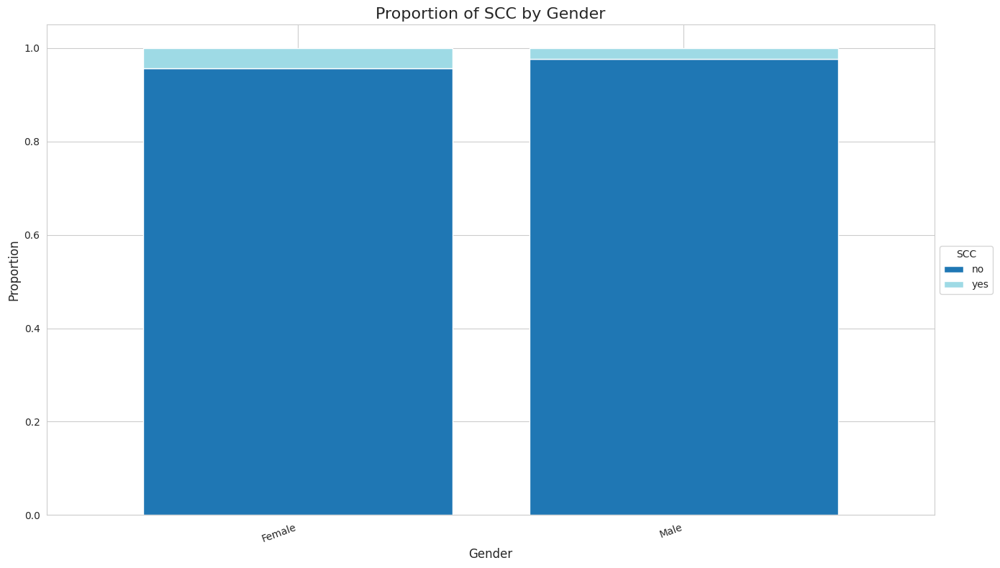

...

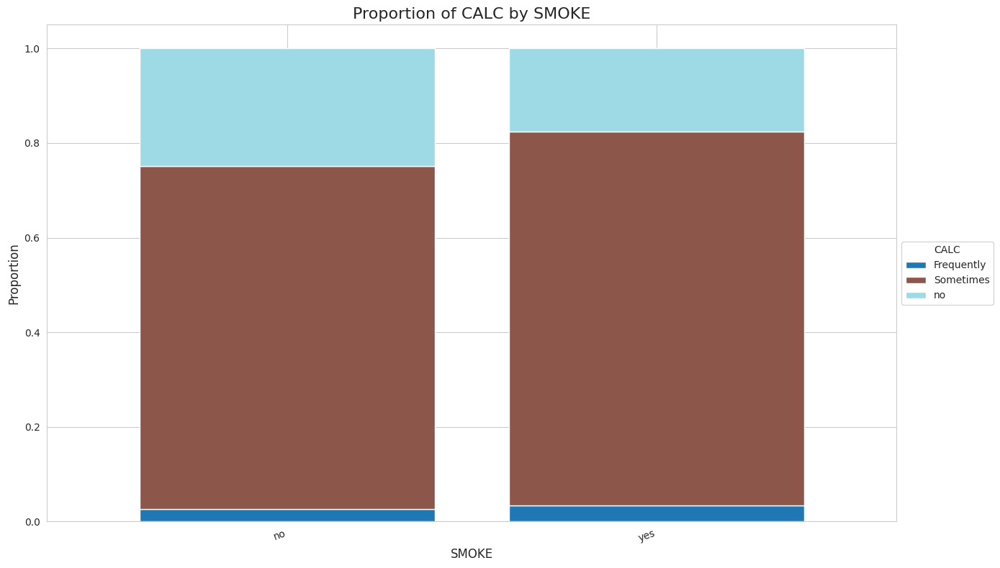

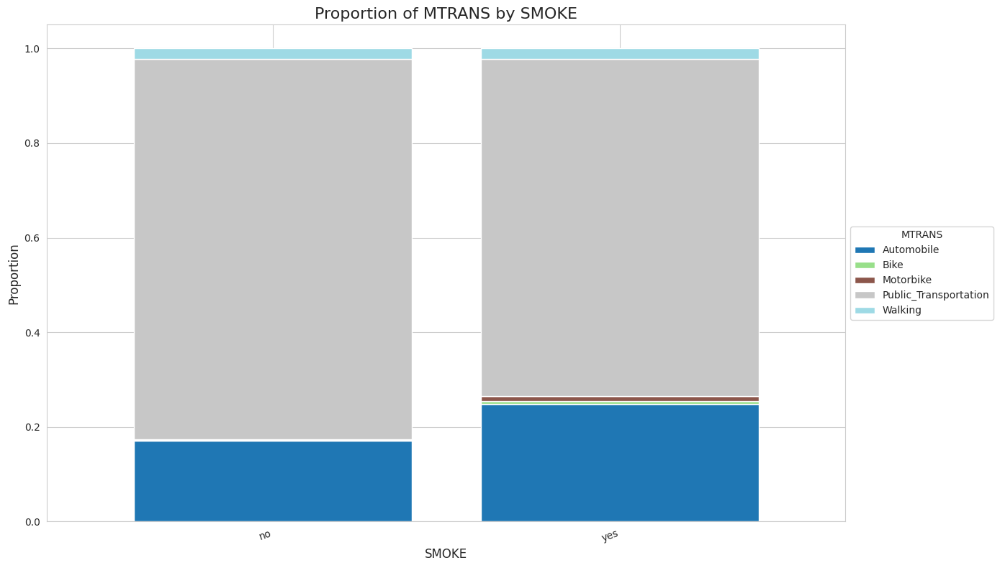

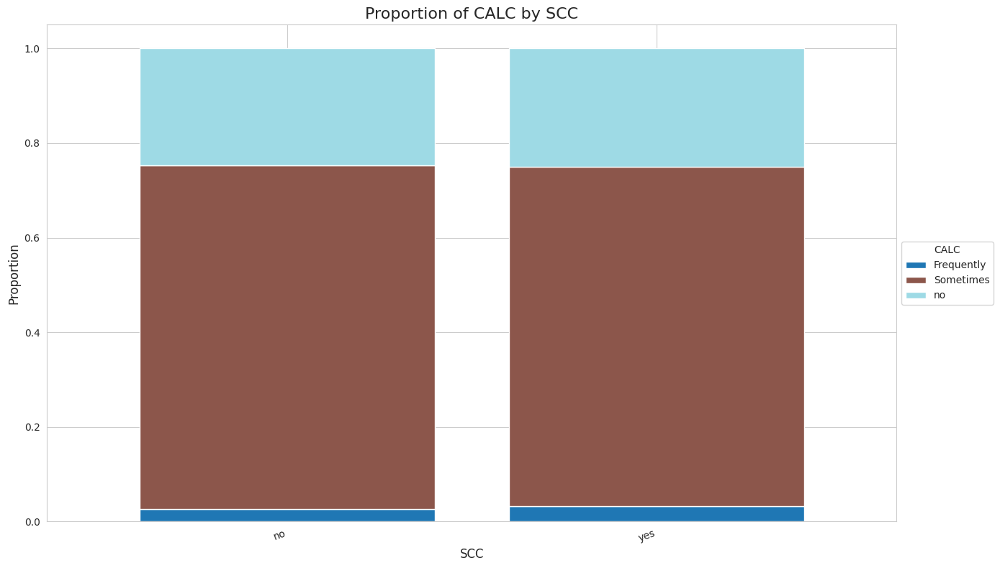

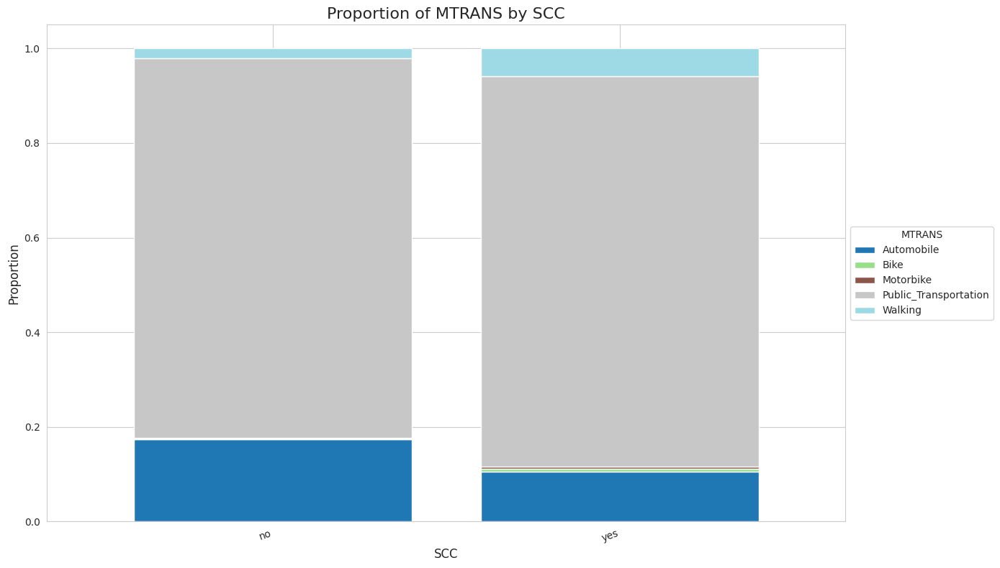

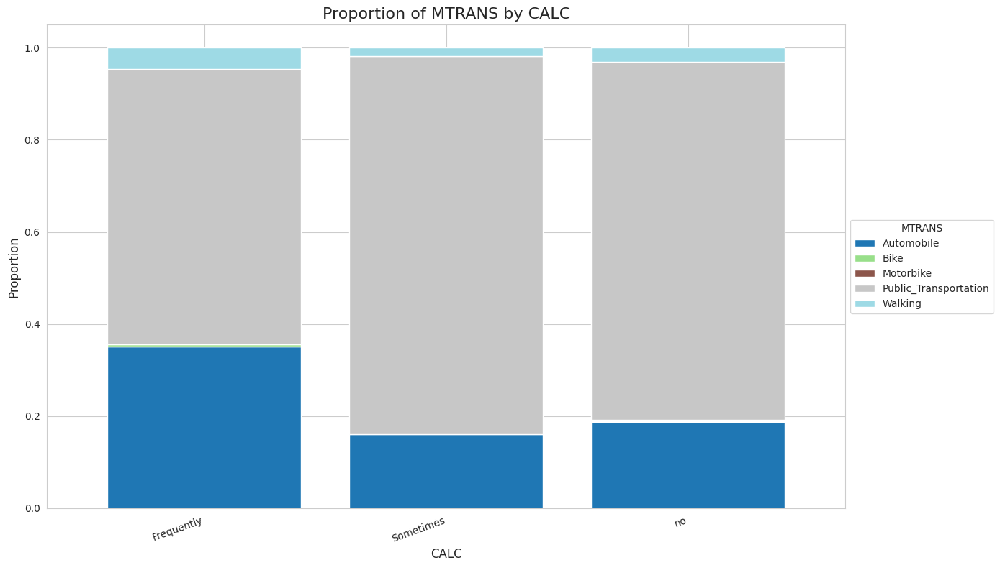

In [ ]:
for i in range(len(categorical_vars)-1):
  for j in range(i+1, len(categorical_vars)-1):

    cat = categorical_vars[i]
    col = categorical_vars[j]

    plt.figure(figsize=(14, 8))

    # Compute normalized proportions for each feature class
    prop_df = df_train.groupby(cat)[col].value_counts(normalize=True).unstack()
    #prop_df = prop_df.reindex(columns=output_order)

    # Plot proportional bar chart
    prop_df.plot(
        kind='bar',
        stacked=True,
        ax=plt.gca(),
        cmap='tab20', # Use a qualitative colormap
        width=0.8
    )

    # 5. Set titles and labels
    plt.title('Proportion of '+col+' by '+cat, fontsize=16)
    plt.xlabel(cat, fontsize=12)
    plt.ylabel('Proportion', fontsize=12)
    plt.xticks(rotation=20, ha='right') # Rotate x-axis labels for readability

    # 6. Place the legend outside the plot
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), title=col)

    # Adjust layout to prevent legend from being cut off
    plt.tight_layout()
    plt.show()

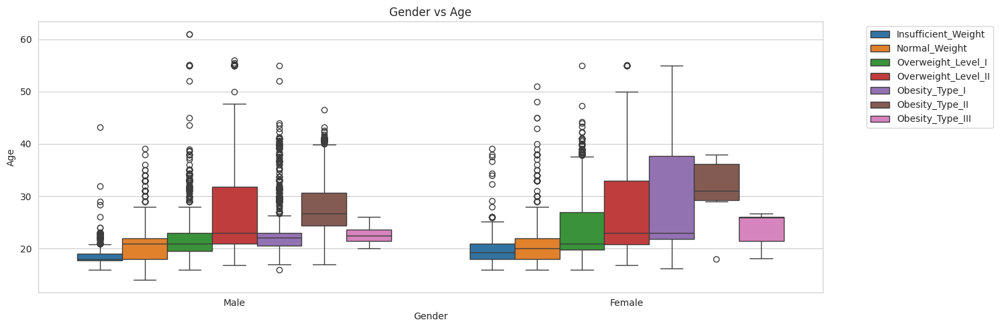

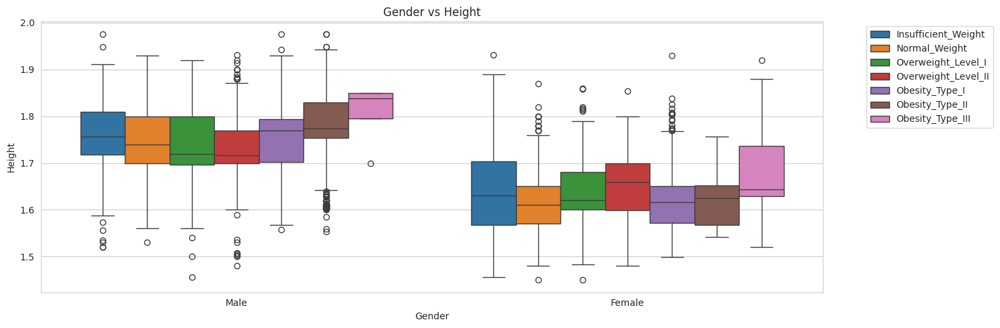

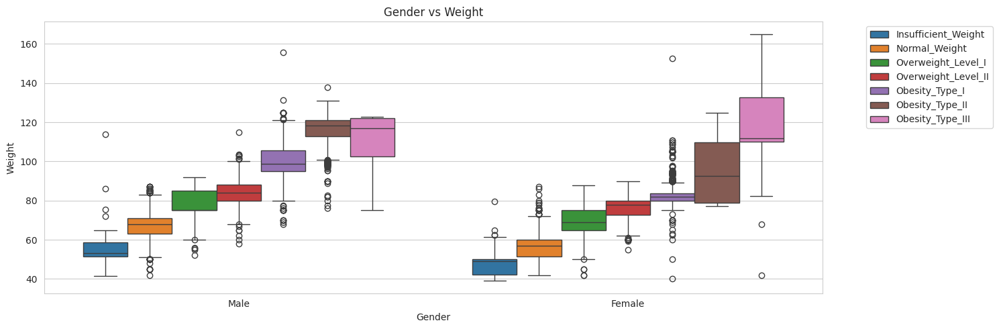

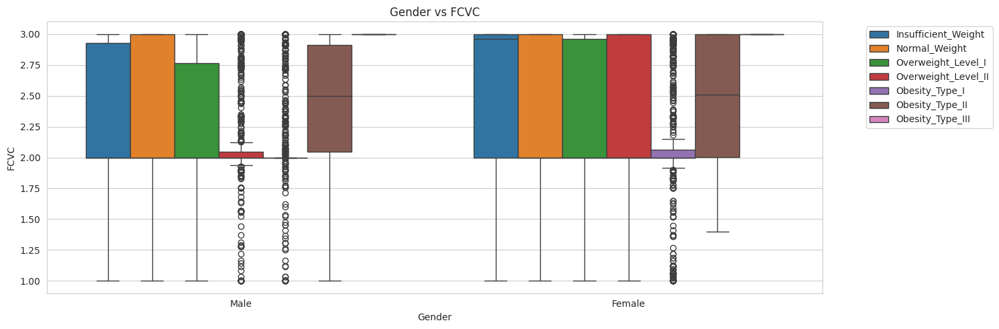

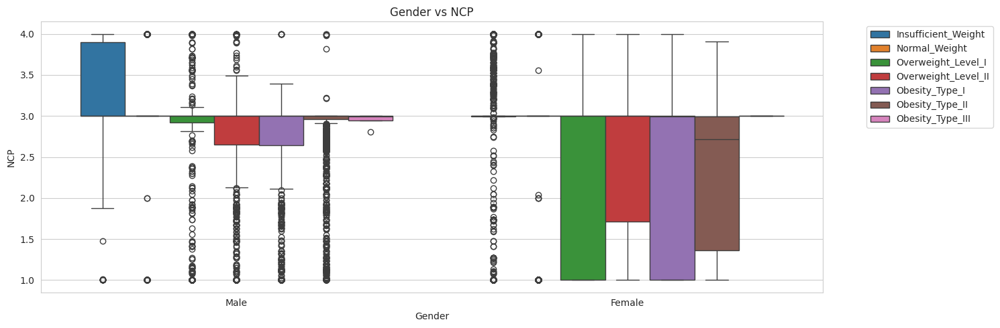

...

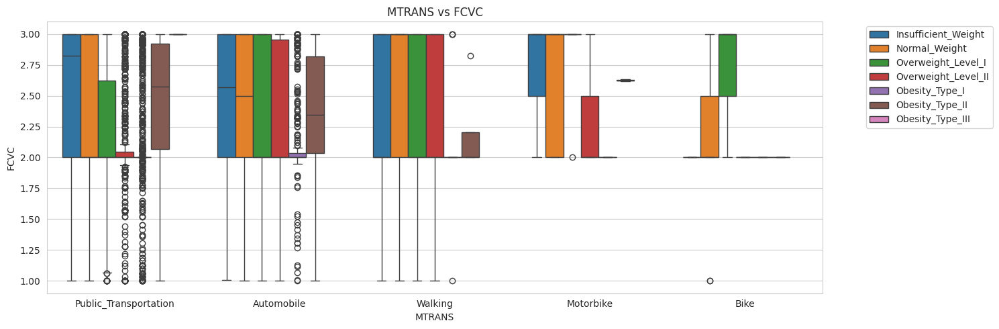

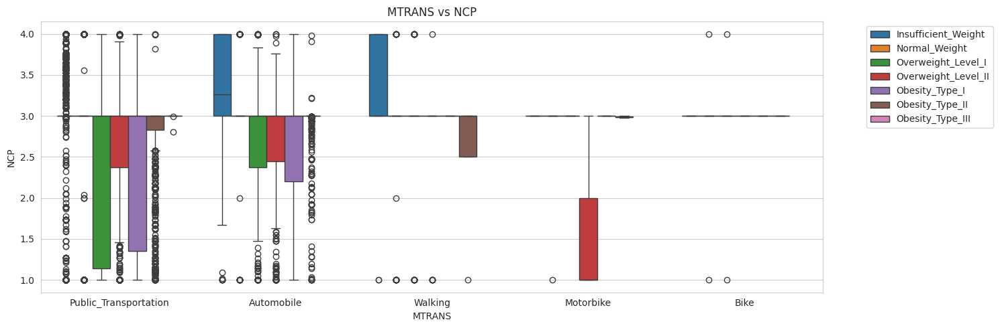

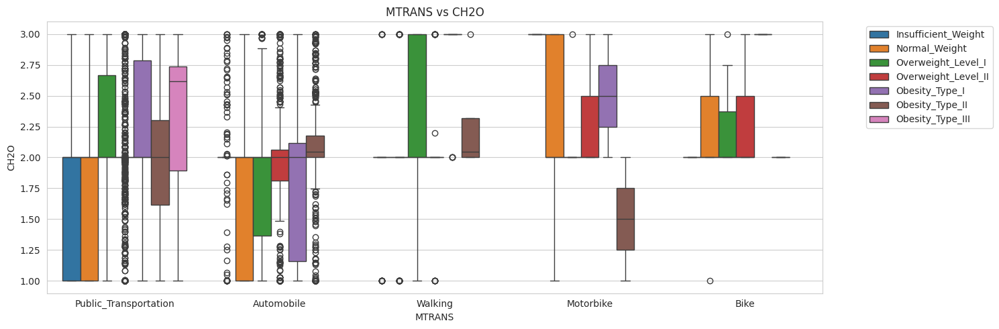

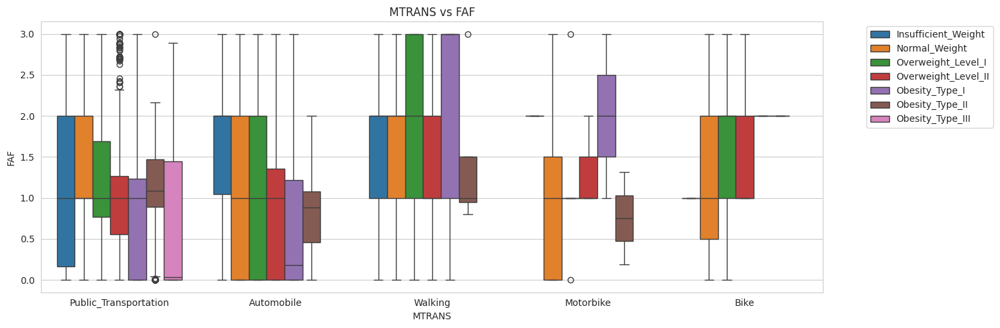

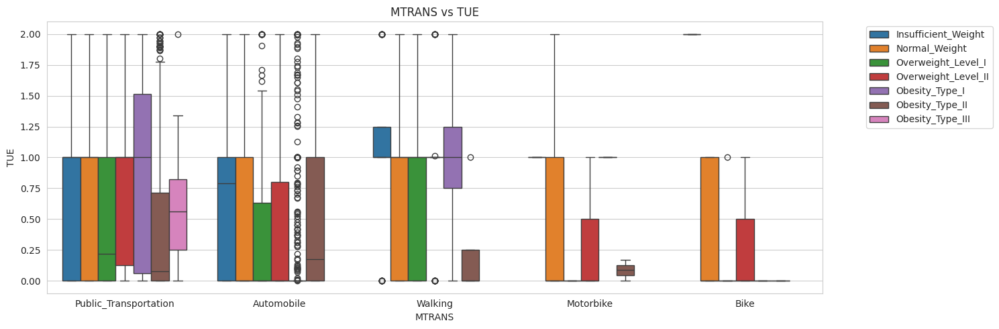

In [ ]:
for cat in categorical_vars:
    for con in continuous_vars:
        if cat == 'WeightCategory':
            continue  # skip plotting against the target column

        plt.figure(figsize=(15, 5))

        sns.boxplot(
                data=train,
                x=cat,
                y=con,
                hue='WeightCategory',
                hue_order=output_order,
                palette=custom_palette
            )

        plt.title(f"{cat} vs {con}")
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

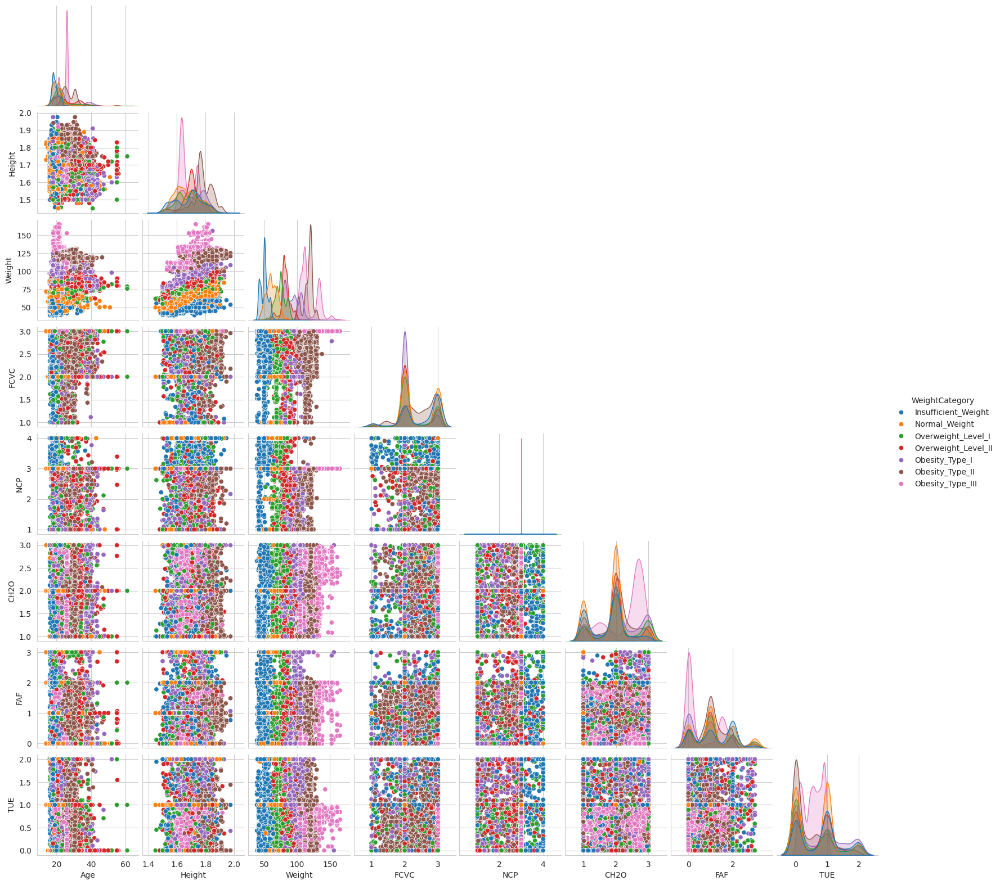

In [ ]:
sns.pairplot(data=train, vars=num_col, hue='WeightCategory', hue_order=output_order, palette=custom_palette, corner=True, height=2)
plt.show()

In [ ]:
#Label Encoding
train['MTRANS'] = np.where(train['MTRANS'].isin(['Walking', 'Bike', 'Motorbike']), 0, 1)
test['MTRANS'] = np.where(test['MTRANS'].isin(['Walking', 'Bike', 'Motorbike']), 0, 1)
for col in lab_col:
    le = LabelEncoder()
    train[col] = le.fit_transform(train[col])
    test[col] = le.transform(test[col])
le = LabelEncoder()
train['WeightCategory'] = le.fit_transform(train['WeightCategory'])

In [ ]:
#Ordinal Encoding
ord_cat = [['no', 'Sometimes', 'Frequently', 'Always']]
oe = OrdinalEncoder(categories = ord_cat*2)
train[ord_col] = oe.fit_transform(train[ord_col])
test[ord_col] = oe.transform(test[ord_col])

In [ ]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 17/17 [00:00<00:00, 44.75it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train.corr()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,WeightCategory
Gender,1.000000,0.060298,0.620797,0.117774,0.093147,0.021916,-0.312216,0.042015,-0.051669,0.058608,0.054988,-0.058699,0.236829,0.058585,-0.029438,-0.061894,0.050023
Age,0.060298,1.000000,-0.014824,0.280320,0.262537,0.048370,0.030279,-0.051373,-0.146515,0.060122,-0.021965,-0.108017,-0.194451,-0.294959,0.076990,0.071582,0.276410
Height,0.620797,-0.014824,1.000000,0.420702,0.229961,0.118650,-0.067065,0.196410,-0.074445,0.066814,0.186031,-0.095829,0.298812,0.080091,0.091133,-0.043061,0.063885
Weight,0.117774,0.280320,0.420702,1.000000,0.514943,0.227025,0.248445,0.096474,-0.338708,0.042901,0.316199,-0.185086,-0.075771,-0.082261,0.212613,0.101050,0.429833
family_history_with_overweight,0.093147,0.262537,0.229961,0.514943,1.000000,0.151242,0.046119,0.045115,-0.207451,0.019353,0.191424,-0.163128,-0.091839,0.003199,-0.005343,0.087998,0.320433
FAVC,0.021916,0.048370,0.118650,0.227025,0.151242,1.000000,0.009623,0.015928,-0.117968,-0.016430,0.037504,-0.112929,-0.059819,0.033899,0.075620,0.124724,0.003047
FCVC,-0.312216,0.030279,-0.067065,0.248445,0.046119,0.009623,1.000000,0.107310,0.011027,-0.007766,0.103753,0.027112,-0.081098,-0.150290,0.126201,0.007275,0.040557
NCP,0.042015,-0.051373,0.196410,0.096474,0.045115,0.015928,0.107310,1.000000,0.091344,0.006481,0.073561,0.012680,0.105726,0.074077,0.104649,-0.042967,-0.091947
CAEC,-0.051669,-0.146515,-0.074445,-0.338708,-0.207451,-0.117968,0.011027,0.091344,1.000000,0.016666,-0.138915,0.101940,0.089105,0.046145,-0.060340,-0.065605,-0.299219
SMOKE,0.058608,0.060122,0.066814,0.042901,0.019353,-0.016430,-0.007766,0.006481,0.016666,1.000000,-0.021165,0.020831,0.012630,-0.013988,0.018085,-0.009684,0.002947


Text(0.5, 1.0, 'Correlation of Features')

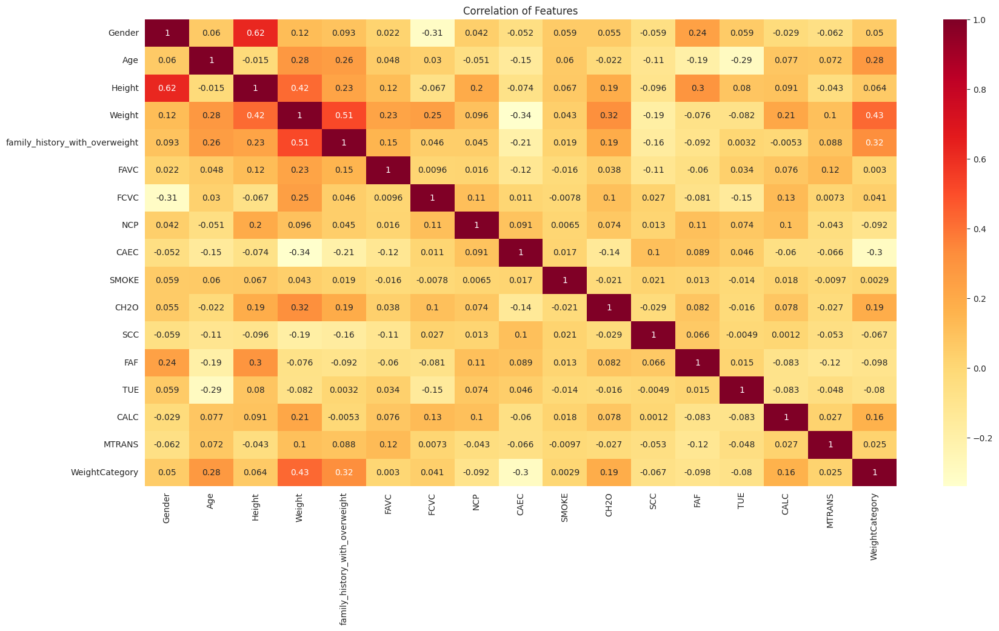

In [ ]:
plt.figure(figsize=(20, 10))
sns.heatmap(train.corr(),annot=True , cmap ='YlOrRd' )
plt.title("Correlation of Features")

## Scaling Continuous Features

In [ ]:
xtrain = train.drop(columns=['WeightCategory'])
ytrain = train['WeightCategory']

xtest = test.drop(columns=['id'])

In [ ]:
scaler = StandardScaler()
xtrain[num_col] = scaler.fit_transform(xtrain[num_col])
xtest[num_col] = scaler.transform(xtest[num_col])

In [ ]:
xtrain

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,1,0.110667,0.000910,-0.231918,1,1,-0.834311,0.315486,1.0,0,1.211010,0,-1.167485,0.602221,1.0,1
1,0,-1.027075,-1.596015,-1.167509,1,1,-0.834311,0.339130,2.0,0,-0.045459,0,0.027524,0.641290,0.0,1
2,0,-1.027075,0.131655,-1.426693,1,1,-1.059346,-1.909206,1.0,0,-0.192933,0,-0.132554,1.759822,0.0,1
3,0,-0.505665,0.123328,1.649315,1,1,1.049363,0.339130,1.0,0,-0.581796,0,0.586624,0.276295,1.0,1
4,1,1.381740,2.444105,0.228033,1,1,0.445954,-1.116801,1.0,0,-0.078619,0,1.184260,0.527908,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15528,1,-1.027075,0.000933,-1.432979,0,1,-0.834311,0.339130,2.0,0,-0.045459,0,0.027524,2.301858,1.0,1
15529,1,-1.027075,0.720712,-1.223505,1,1,0.646272,0.339130,1.0,0,-0.106926,1,-1.133783,1.573320,1.0,1
15530,0,-0.848686,-0.148085,-1.445836,0,1,-2.617143,0.979793,1.0,0,-1.690972,0,1.224002,0.641290,1.0,1
15531,1,-0.183369,1.203721,-0.096977,1,1,-0.834311,-0.945934,1.0,0,0.699935,0,-0.215338,-1.019279,1.0,1


In [ ]:
xtest

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,0,-0.849222,0.827343,1.898772,1,1,1.049363,0.339130,1.0,0,-0.033368,0,0.584315,0.331153,1.0,1
1,0,-0.396292,-0.017934,-0.484871,1,1,-0.834311,0.339130,1.0,0,-0.045459,0,0.718028,2.079095,1.0,1
2,1,-0.270402,0.428151,-0.219401,1,1,-0.834311,-0.056315,1.0,0,-0.324186,0,-0.628525,-1.019279,1.0,1
3,1,1.253777,0.863057,1.254353,1,1,0.508272,0.339130,1.0,0,0.192100,0,-0.315771,-0.853143,1.0,1
4,0,-1.027075,-0.341270,-0.864114,0,1,-0.834311,0.339130,1.0,0,-0.045459,0,0.027524,0.641290,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5220,1,0.233230,0.760921,1.001273,1,1,0.897885,0.339130,1.0,0,0.204345,0,0.422497,-0.692678,1.0,1
5221,1,-1.027075,0.115001,-1.432979,0,1,1.049363,1.754678,2.0,0,-1.690972,0,1.222532,0.641290,1.0,1
5222,1,-0.656064,1.364693,0.674874,1,1,-0.066117,0.339130,1.0,0,-0.045459,0,0.216383,0.970811,0.0,1
5223,1,1.772324,0.000933,-0.161752,1,1,0.430083,-1.116801,1.0,0,0.192874,0,-1.167485,0.597839,0.0,1


# Models

In [ ]:
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier
from mixed_naive_bayes import MixedNB
from sklearn.tree import DecisionTreeClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

In [ ]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

## XGBoost

In [ ]:
param = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.03, 0.1, 0.3],
    'max_depth': [4, 6, 8]
}
xgb = XGBClassifier(eval_metric='mlogloss', random_state=42)
gridxgb = GridSearchCV(estimator=xgb, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridxgb.fit(xtrain, ytrain)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.856, test=0.847) total time=   1.3s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.859, test=0.854) total time=   3.6s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.853, test=0.846) total time=   1.3s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.854, test=0.849) total time=   1.2s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.856, test=0.847) total time=   1.2s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=200;, score=(train=0.867, test=0.860) total time=   2.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=200;, score=(train=0.870, test=0.867) total time=   2.3s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=200;, score=(train=0.868, test=0.859) total time=   4.3s
[CV 4/5] E

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='mlogloss', feature_types=None,
                                     feature_weights=None, gamma=None,
                                     grow...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             param_grid={'learning_rate': [0.01, 0.03, 0.1, 0.3],
                         'max_depth': [4, 6, 8], 'n_estimators': [100, 200]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridxgb.best_score_)
print(gridxgb.best_params_)
bestxgb = gridxgb.best_estimator_
ypredtrain = bestxgb.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.9032382686541057
{'learning_rate': 0.3, 'max_depth': 4, 'n_estimators': 100}
0.9512650486061933
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1870
           1       0.92      0.94      0.93      2345
           2       0.95      0.95      0.95      2207
           3       0.99      0.99      0.99      2403
           4       1.00      1.00      1.00      2983
           5       0.90      0.86      0.88      1844
           6       0.89      0.91      0.90      1881

    accuracy                           0.95     15533
   macro avg       0.95      0.95      0.95     15533
weighted avg       0.95      0.95      0.95     15533

[[1803   64    1    0    0    1    1]
 [  64 2215    2    0    0   53   11]
 [   1    2 2090   25    3   23   63]
 [   0    0   15 2384    0    0    4]
 [   1    0    0    0 2980    2    0]
 [   9   98   22    0    0 1590  125]
 [   1   18   59    1    0   88 1714]]


## Gradient Boost

In [ ]:
param = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.03, 0.1, 0.3],
    'max_depth': [4, 6, 8]
}
gb = GradientBoostingClassifier(min_samples_leaf=2, random_state=42)
gridgb = GridSearchCV(estimator=gb, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridgb.fit(xtrain, ytrain)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.871, test=0.855) total time=  23.4s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.873, test=0.861) total time=  27.8s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.869, test=0.860) total time=  42.8s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.868, test=0.863) total time=  24.1s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=100;, score=(train=0.871, test=0.861) total time=  30.2s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=200;, score=(train=0.893, test=0.882) total time=  57.5s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=200;, score=(train=0.892, test=0.875) total time=  47.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=200;, score=(train=0.890, test=0.877) total time= 1.0min
[CV 4/5] E

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=GradientBoostingClassifier(min_samples_leaf=2,
                                                  random_state=42),
             param_grid={'learning_rate': [0.01, 0.03, 0.1, 0.3],
                         'max_depth': [4, 6, 8], 'n_estimators': [100, 200]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridgb.best_score_)
print(gridgb.best_params_)
bestgb = gridgb.best_estimator_
ypredtrain = bestgb.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.9010493099622792
{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100}
0.9414150518251465
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1870
           1       0.91      0.93      0.92      2345
           2       0.94      0.94      0.94      2207
           3       0.98      0.99      0.99      2403
           4       1.00      1.00      1.00      2983
           5       0.88      0.84      0.86      1844
           6       0.87      0.89      0.88      1881

    accuracy                           0.94     15533
   macro avg       0.94      0.93      0.94     15533
weighted avg       0.94      0.94      0.94     15533

[[1797   67    0    0    0    5    1]
 [  66 2179    2    0    0   74   24]
 [   1    4 2065   29    1   35   72]
 [   0    0   15 2382    0    0    6]
 [   0    0    0    0 2981    2    0]
 [   9  108   29    0    0 1549  149]
 [   1   24   77    8    0  101 1670]]


## AdaBoost

In [ ]:
param = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.1, 0.3, 0.5, 0.7, 1]
}
ab = AdaBoostClassifier(random_state=42)
gridab = GridSearchCV(estimator=ab, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridab.fit(xtrain, ytrain)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.438, test=0.438) total time=   2.5s
[CV 2/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.440, test=0.439) total time=   3.0s
[CV 3/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.438, test=0.442) total time=   2.2s
[CV 4/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.438, test=0.437) total time=   1.3s
[CV 5/5] END learning_rate=0.1, n_estimators=100;, score=(train=0.439, test=0.437) total time=   1.3s
[CV 1/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.445, test=0.443) total time=   2.6s
[CV 2/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.444, test=0.445) total time=   3.3s
[CV 3/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.444, test=0.447) total time=   2.6s
[CV 4/5] END learning_rate=0.1, n_estimators=200;, score=(train=0.482, test=0.487) total time=   2.6s
[CV 5/5] END learnin

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=AdaBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.1, 0.3, 0.5, 0.7, 1],
                         'n_estimators': [100, 200, 300, 400, 500]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridab.best_score_)
print(gridab.best_params_)
bestab = gridab.best_estimator_
ypredtrain = bestab.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.7218172371507663
{'learning_rate': 0.3, 'n_estimators': 400}
0.7730637996523531
              precision    recall  f1-score   support

           0       0.74      0.83      0.78      1870
           1       0.65      0.69      0.67      2345
           2       0.71      0.76      0.73      2207
           3       0.90      0.88      0.89      2403
           4       0.95      1.00      0.97      2983
           5       0.74      0.43      0.55      1844
           6       0.63      0.68      0.65      1881

    accuracy                           0.77     15533
   macro avg       0.76      0.75      0.75     15533
weighted avg       0.77      0.77      0.77     15533

[[1543  323    1    1    0    2    0]
 [ 494 1625    1    0    0  165   60]
 [   2    1 1677  228   48   37  214]
 [   0    0  187 2114   98    0    4]
 [   1    2    1    2 2975    0    2]
 [  34  447   91    0    0  800  472]
 [  11   99  414   12    0   71 1274]]


## Random Forest

In [ ]:
param = {
    'n_estimators': [100, 200, 300],
    'max_depth': [8, 10, 12]
}
brf = BalancedRandomForestClassifier(min_samples_leaf=2, random_state=42)
gridbrf = GridSearchCV(estimator=brf, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridbrf.fit(xtrain, ytrain)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END max_depth=8, n_estimators=100;, score=(train=0.907, test=0.887) total time=   2.0s
[CV 2/5] END max_depth=8, n_estimators=100;, score=(train=0.904, test=0.878) total time=   2.8s
[CV 3/5] END max_depth=8, n_estimators=100;, score=(train=0.906, test=0.875) total time=   1.9s
[CV 4/5] END max_depth=8, n_estimators=100;, score=(train=0.904, test=0.882) total time=   1.9s
[CV 5/5] END max_depth=8, n_estimators=100;, score=(train=0.904, test=0.886) total time=   1.9s
[CV 1/5] END max_depth=8, n_estimators=200;, score=(train=0.906, test=0.890) total time=   3.9s
[CV 2/5] END max_depth=8, n_estimators=200;, score=(train=0.907, test=0.878) total time=   4.9s
[CV 3/5] END max_depth=8, n_estimators=200;, score=(train=0.909, test=0.875) total time=   4.0s
[CV 4/5] END max_depth=8, n_estimators=200;, score=(train=0.904, test=0.883) total time=   4.2s
[CV 5/5] END max_depth=8, n_estimators=200;, score=(train=0.906, test=0.889)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=BalancedRandomForestClassifier(min_samples_leaf=2,
                                                      random_state=42),
             param_grid={'max_depth': [8, 10, 12],
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridbrf.best_score_)
print(gridbrf.best_params_)
bestbrf = gridbrf.best_estimator_
ypredtrain = bestbrf.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.8942253652772099
{'max_depth': 12, 'n_estimators': 100}
0.9495268138801262
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1870
           1       0.95      0.94      0.94      2345
           2       0.95      0.93      0.94      2207
           3       0.98      0.99      0.98      2403
           4       1.00      1.00      1.00      2983
           5       0.90      0.88      0.89      1844
           6       0.87      0.92      0.90      1881

    accuracy                           0.95     15533
   macro avg       0.94      0.95      0.94     15533
weighted avg       0.95      0.95      0.95     15533

[[1818   46    0    1    0    4    1]
 [  65 2194    1    0    0   61   24]
 [   2    2 2042   33    7   33   88]
 [   0    0   21 2368    0    0   14]
 [   1    0    2    3 2975    2    0]
 [  12   64   22    0    0 1619  127]
 [   0   14   52    5    0   77 1733]]


## Decision tree

In [ ]:
param = {
    'max_depth': [5, 8, 10, 12, 15, 17, 20, 22, 25]
}
dt = DecisionTreeClassifier(min_samples_leaf=2, random_state=42)
griddt = GridSearchCV(estimator=dt, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
griddt.fit(xtrain, ytrain)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END ...max_depth=5;, score=(train=0.838, test=0.827) total time=   0.1s
[CV 2/5] END ...max_depth=5;, score=(train=0.835, test=0.833) total time=   0.1s
[CV 3/5] END ...max_depth=5;, score=(train=0.839, test=0.831) total time=   0.1s
[CV 4/5] END ...max_depth=5;, score=(train=0.826, test=0.831) total time=   0.1s
[CV 5/5] END ...max_depth=5;, score=(train=0.836, test=0.833) total time=   0.1s
[CV 1/5] END ...max_depth=8;, score=(train=0.893, test=0.862) total time=   0.1s
[CV 2/5] END ...max_depth=8;, score=(train=0.889, test=0.869) total time=   0.1s
[CV 3/5] END ...max_depth=8;, score=(train=0.891, test=0.867) total time=   0.1s
[CV 4/5] END ...max_depth=8;, score=(train=0.889, test=0.870) total time=   0.1s
[CV 5/5] END ...max_depth=8;, score=(train=0.893, test=0.875) total time=   0.1s
[CV 1/5] END ..max_depth=10;, score=(train=0.914, test=0.871) total time=   0.1s
[CV 2/5] END ..max_depth=10;, score=(train=0.914,

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=DecisionTreeClassifier(min_samples_leaf=2,
                                              random_state=42),
             param_grid={'max_depth': [5, 8, 10, 12, 15, 17, 20, 22, 25]},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(griddt.best_score_)
print(griddt.best_params_)
bestdt = griddt.best_estimator_
ypredtrain = bestdt.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.869632827520517
{'max_depth': 10}
0.9106418592673663
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      1870
           1       0.86      0.90      0.88      2345
           2       0.91      0.92      0.91      2207
           3       0.98      0.98      0.98      2403
           4       1.00      1.00      1.00      2983
           5       0.79      0.76      0.78      1844
           6       0.83      0.81      0.82      1881

    accuracy                           0.91     15533
   macro avg       0.90      0.90      0.90     15533
weighted avg       0.91      0.91      0.91     15533

[[1770   92    0    0    0    6    2]
 [ 100 2114    2    0    0  115   14]
 [   3    2 2021   28    1   46  106]
 [   1    0   47 2347    0    0    8]
 [   1    1    6    3 2971    1    0]
 [  12  218   31    0    0 1402  181]
 [   1   34  121    7    0  198 1520]]


## Naive Bayes

In [ ]:
categorical_inds = [xtrain.columns.get_loc(col) for col in categorical_vars[:-1]]

nb = MixedNB(categorical_features=categorical_inds)
nb.fit(xtrain, ytrain)

MixedNB(alpha=0.5, var_smoothing=1e-09)

In [ ]:
ypredtrain = nb.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.7233631622996202
              precision    recall  f1-score   support

           0       0.74      0.82      0.77      1870
           1       0.63      0.54      0.58      2345
           2       0.66      0.66      0.66      2207
           3       0.86      0.85      0.86      2403
           4       0.83      1.00      0.91      2983
           5       0.60      0.47      0.53      1844
           6       0.60      0.58      0.59      1881

    accuracy                           0.72     15533
   macro avg       0.70      0.70      0.70     15533
weighted avg       0.71      0.72      0.72     15533

[[1530  317    0    1   15    4    3]
 [ 513 1258    9    0  216  267   82]
 [   2    7 1467  295   85  121  230]
 [   0    0  253 2051   87    1   11]
 [   1    0    0    1 2981    0    0]
 [  34  304  128    0  112  861  405]
 [   1  115  376   35   88  178 1088]]


## Ball tree

In [ ]:
param = {
    'radius': [2.5, 3, 3.5, 4, 4.5],
    'weights': ['uniform', 'distance']
}
rn = RadiusNeighborsClassifier()
gridrn = GridSearchCV(estimator=rn, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridrn.fit(xtrain, ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END radius=2.5, weights=uniform;, score=(train=0.682, test=nan) total time=   0.3s
[CV 2/5] END radius=2.5, weights=uniform;, score=(train=0.678, test=nan) total time=   0.3s
[CV 3/5] END radius=2.5, weights=uniform;, score=(train=0.682, test=nan) total time=   0.3s
[CV 4/5] END radius=2.5, weights=uniform;, score=(train=0.683, test=nan) total time=   0.3s
[CV 5/5] END radius=2.5, weights=uniform;, score=(train=0.680, test=nan) total time=   0.5s
[CV 1/5] END radius=2.5, weights=distance;, score=(train=1.000, test=nan) total time=   0.4s
[CV 2/5] END radius=2.5, weights=distance;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5] END radius=2.5, weights=distance;, score=(train=1.000, test=nan) total time=   0.3s
[CV 4/5] END radius=2.5, weights=distance;, score=(train=1.000, test=nan) total time=   0.3s
[CV 5/5] END radius=2.5, weights=distance;, score=(train=1.000, test=nan) total time=   0.3s
[CV 1/5] END r

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RadiusNeighborsClassifier(),
             param_grid={'radius': [2.5, 3, 3.5, 4, 4.5],
                         'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridrn.best_score_)
print(gridrn.best_params_)
bestrn = gridrn.best_estimator_
ypredtrain = bestrn.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.541041364129893
{'radius': 3.5, 'weights': 'distance'}
1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1870
           1       1.00      1.00      1.00      2345
           2       1.00      1.00      1.00      2207
           3       1.00      1.00      1.00      2403
           4       1.00      1.00      1.00      2983
           5       1.00      1.00      1.00      1844
           6       1.00      1.00      1.00      1881

    accuracy                           1.00     15533
   macro avg       1.00      1.00      1.00     15533
weighted avg       1.00      1.00      1.00     15533

[[1870    0    0    0    0    0    0]
 [   0 2345    0    0    0    0    0]
 [   0    0 2207    0    0    0    0]
 [   0    0    0 2403    0    0    0]
 [   0    0    0    0 2983    0    0]
 [   0    0    0    0    0 1844    0]
 [   0    0    0    0    0    0 1881]]


## KNN

In [ ]:
print(int(15533**0.5))

124


In [ ]:
param = {
    'n_neighbors': [31, 63, 125, 189, 251],
    'weights': ['uniform', 'distance']
}
knn = KNeighborsClassifier()
gridknn = GridSearchCV(estimator=knn, param_grid=param, scoring='accuracy', cv=skf, verbose=3, return_train_score=True)
gridknn.fit(xtrain, ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END n_neighbors=31, weights=uniform;, score=(train=0.767, test=0.744) total time=   0.8s
[CV 2/5] END n_neighbors=31, weights=uniform;, score=(train=0.764, test=0.751) total time=   1.3s
[CV 3/5] END n_neighbors=31, weights=uniform;, score=(train=0.764, test=0.744) total time=   0.4s
[CV 4/5] END n_neighbors=31, weights=uniform;, score=(train=0.763, test=0.744) total time=   0.5s
[CV 5/5] END n_neighbors=31, weights=uniform;, score=(train=0.766, test=0.737) total time=   0.4s
[CV 1/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.753) total time=   0.3s
[CV 2/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.759) total time=   0.5s
[CV 3/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.748) total time=   0.3s
[CV 4/5] END n_neighbors=31, weights=distance;, score=(train=1.000, test=0.756) total time=   0.3s
[CV 5/5] END n_neighbors=31, weights=distance;, score

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [31, 63, 125, 189, 251],
                         'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='accuracy', verbose=3)

In [ ]:
print(gridknn.best_score_)
print(gridknn.best_params_)
bestknn = gridknn.best_estimator_
ypredtrain = bestknn.predict(xtrain)
print(accuracy_score(ytrain, ypredtrain))
print(classification_report(ytrain, ypredtrain))
print(confusion_matrix(ytrain, ypredtrain))

0.7531062629697477
{'n_neighbors': 31, 'weights': 'distance'}
1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1870
           1       1.00      1.00      1.00      2345
           2       1.00      1.00      1.00      2207
           3       1.00      1.00      1.00      2403
           4       1.00      1.00      1.00      2983
           5       1.00      1.00      1.00      1844
           6       1.00      1.00      1.00      1881

    accuracy                           1.00     15533
   macro avg       1.00      1.00      1.00     15533
weighted avg       1.00      1.00      1.00     15533

[[1870    0    0    0    0    0    0]
 [   0 2345    0    0    0    0    0]
 [   0    0 2207    0    0    0    0]
 [   0    0    0 2403    0    0    0]
 [   0    0    0    0 2983    0    0]
 [   0    0    0    0    0 1844    0]
 [   0    0    0    0    0    0 1881]]


## Submission file

In [ ]:
model = bestxgb

ypredtest = model.predict(xtest)
test_pred_labels = le.inverse_transform(ypredtest)
submission = pd.DataFrame({
    'id': test['id'],
    'WeightCategory': test_pred_labels
})
submission.to_csv('submission.csv', index=False)

In [ ]:
submission

,id,WeightCategory
0,15533,Obesity_Type_III
1,15534,Overweight_Level_I
2,15535,Overweight_Level_II
3,15536,Obesity_Type_II
4,15537,Normal_Weight
...,...,...
5220,20753,Obesity_Type_II
5221,20754,Insufficient_Weight
5222,20755,Obesity_Type_I
5223,20756,Overweight_Level_II
